# COCO Object Detection — YOLO11 (reviewed pipeline)

annotations -> balanced class-filtered subset -> YOLO labels -> train -> val/test -> predict -> export.

**Runtime:** GPU required (Runtime -> Change runtime type -> T4 GPU).

### Read this before running

`yolo11s.pt` is already trained on all 80 COCO classes. If you only want a working
COCO detector, run section 9 — there is nothing to train. This notebook builds a
**specialised** detector on a subset of classes.


In [ ]:
!pip install -q ultralytics pycocotools


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 81.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 8.8 MB/s eta 0:00:00


In [ ]:
import torch
from ultralytics import YOLO
import ultralytics

print("ultralytics:", ultralytics.__version__)
print("torch:", torch.__version__)
print("CUDA:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("VRAM:", round(torch.cuda.get_device_properties(0).total_memory / 1e9, 1), "GB")
else:
    raise RuntimeError("No GPU. Runtime -> Change runtime type -> T4 GPU")


Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
ultralytics: 8.4.156
torch: 2.11.0+cu128
CUDA: True
GPU: Tesla T4
VRAM: 15.6 GB


## 1. Configuration

`MAX_TRAIN_IMAGES` is the main cost lever: one HTTP request per image, so 8,000 takes
roughly 6-10 minutes. Training is then about 4 min/epoch for `yolo11s` at 640px on a T4.

On class count: every class you add competes for the same image budget. Ten classes at
8k images is thin. If a class ends up under ~1,000 instances its AP will be noise —
either raise `MAX_TRAIN_IMAGES` or cut the class.


In [ ]:
# Pick any COCO class names. None = all 80.
CLASSES = [
    "person",
    "bicycle",
    "car",
    "motorcycle",
    "bus",
    "truck",
    "traffic light",
    "stop sign",
    "dog",
    "cat",
]

MAX_TRAIN_IMAGES = 8000
MAX_VAL_IMAGES = 1500        # val2017 subset, then split below
TEST_FRACTION = 0.35         # of MAX_VAL_IMAGES, held out from model selection

# Keep a few images with no objects at all. Ultralytics recommends ~1% background
# images to suppress false positives on empty scenes. 0.0 disables.
BG_FRACTION = 0.01

# Images whose only instances of a selected class are iscrowd regions contain
# unlabelled positives. True = drop them (cleaner labels, fewer images).
DROP_CROWD_ONLY_IMAGES = True

MODEL_WEIGHTS = "yolo11s.pt"     # n / s / m / l / x
PRETRAINED = True                # False -> built from yolo11s.yaml, random init

EPOCHS = 50
IMGSZ = 640
BATCH = 16
SEED = 0

DATA_ROOT = "/content/coco_subset"
RUN_NAME = "yolo11s_coco_subset"

USE_DRIVE = True   # write weights to Drive so a disconnect doesn't lose the run


In [ ]:
import os

if USE_DRIVE:
    from google.colab import drive

    drive.mount("/content/drive")
    PROJECT_DIR = "/content/drive/MyDrive/coco_detection"
else:
    PROJECT_DIR = "/content/coco_detection"

os.makedirs(PROJECT_DIR, exist_ok=True)
print("Runs will be written to:", PROJECT_DIR)


Mounted at /content/drive
Runs will be written to: /content/drive/MyDrive/coco_detection


## 2. Download the COCO annotations

Annotations only — about 250 MB zipped. The images come later, and only the ones we
actually need.


In [ ]:
import urllib.request
import zipfile

ANN_DIR = "/content/coco_annotations"
ANN_URL = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"

if not os.path.exists(f"{ANN_DIR}/annotations/instances_train2017.json"):
    os.makedirs(ANN_DIR, exist_ok=True)
    zip_path = "/content/ann.zip"

    print("Downloading annotations (~250 MB)...")
    urllib.request.urlretrieve(ANN_URL, zip_path)

    print("Extracting...")
    with zipfile.ZipFile(zip_path) as z:
        z.extractall(ANN_DIR)

    os.remove(zip_path)
    print("Done.")
else:
    print("Annotations already present.")

for f in sorted(os.listdir(f"{ANN_DIR}/annotations")):
    size = os.path.getsize(f"{ANN_DIR}/annotations/{f}") / 1e6
    print(f"  {f:<45} {size:>8.1f} MB")


Extracting...
Done.
  captions_train2017.json                           91.9 MB
  captions_val2017.json                              3.9 MB
  instances_train2017.json                         469.8 MB
  instances_val2017.json                            20.0 MB
  person_keypoints_train2017.json                  238.9 MB
  person_keypoints_val2017.json                     10.0 MB


In [ ]:
from pycocotools.coco import COCO

coco_train = COCO(f"{ANN_DIR}/annotations/instances_train2017.json")
coco_val = COCO(f"{ANN_DIR}/annotations/instances_val2017.json")

all_names = [c["name"] for c in coco_train.loadCats(coco_train.getCatIds())]
print(f"\n{len(all_names)} COCO classes:")
print(", ".join(all_names))


loading annotations into memory...
Done (t=15.98s)
creating index...
index created!
loading annotations into memory...
Done (t=0.52s)
creating index...
index created!

80 COCO classes:
person, bicycle, car, motorcycle, airplane, bus, train, truck, boat, traffic light, fire hydrant, stop sign, parking meter, bench, bird, cat, dog, horse, sheep, cow, elephant, bear, zebra, giraffe, backpack, umbrella, handbag, tie, suitcase, frisbee, skis, snowboard, sports ball, kite, baseball bat, baseball glove, skateboard, surfboard, tennis racket, bottle, wine glass, cup, fork, knife, spoon, bowl, banana, apple, sandwich, orange, broccoli, carrot, hot dog, pizza, donut, cake, chair, couch, potted plant, bed, dining table, toilet, tv, laptop, mouse, remote, keyboard, cell phone, microwave, oven, toaster, sink, refrigerator, book, clock, vase, scissors, teddy bear, hair drier, toothbrush


## 3. Select images — balanced across classes

COCO category IDs are not contiguous (1-90 with gaps), so we build an explicit
0-indexed remap.

**This is the cell that changed most.** The old version pooled every image containing
any selected class, shuffled, and took the first N. Because roughly 64k of COCO's 118k
train images contain a person and only ~1.7k contain a stop sign, that sample is COCO's
skew reproduced exactly — a 8k sample gives you ~110 stop-sign images. Round-robin
sampling instead walks the classes in turn and takes one image for each, so rare classes
drain their entire pool before the budget runs out.

Perfect balance is impossible (a stop-sign image usually also contains cars and people,
and there are only so many stop-sign images in COCO), but this moves the ratio from
~600:1 down to something trainable.


In [ ]:
import random

if CLASSES is None:
    CLASSES = all_names

missing = [c for c in CLASSES if c not in all_names]
assert not missing, f"Not COCO classes: {missing}"

name_to_cocoid = {n: coco_train.getCatIds(catNms=[n])[0] for n in CLASSES}
cat_ids = [name_to_cocoid[n] for n in CLASSES]
id_to_idx = {name_to_cocoid[n]: i for i, n in enumerate(CLASSES)}

print(f"{len(CLASSES)} classes selected\n")
for i, n in enumerate(CLASSES):
    n_imgs = len(coco_train.getImgIds(catIds=[name_to_cocoid[n]]))
    print(f"  {i:>2}  {n:<15} (coco id {name_to_cocoid[n]:>2})  {n_imgs:>6,} images in train2017")


def has_noncrowd_instance(coco, img_id, cid):
    """True if the image has at least one non-crowd box of this category."""
    anns = coco.loadAnns(coco.getAnnIds(imgIds=[img_id], catIds=[cid], iscrowd=False))
    return len(anns) > 0


def select_images_balanced(coco, class_names, limit, seed=42, skip_crowd_only=True):
    """Round-robin over classes so rare classes are not drowned out."""
    rng = random.Random(seed)

    pools = {}
    for n in class_names:
        cid = name_to_cocoid[n]
        ids = sorted(coco.getImgIds(catIds=[cid]))
        rng.shuffle(ids)
        pools[n] = ids

    chosen = []
    seen = set()
    order = list(class_names)

    while len(chosen) < limit and any(pools.values()):
        for n in order:
            if len(chosen) >= limit:
                break
            cid = name_to_cocoid[n]
            while pools[n]:
                img_id = pools[n].pop()
                if img_id in seen:
                    continue
                if skip_crowd_only and not has_noncrowd_instance(coco, img_id, cid):
                    continue
                seen.add(img_id)
                chosen.append(img_id)
                break

    return sorted(chosen)


train_ids = select_images_balanced(
    coco_train, CLASSES, MAX_TRAIN_IMAGES, seed=SEED, skip_crowd_only=DROP_CROWD_ONLY_IMAGES
)
valtest_ids = select_images_balanced(
    coco_val, CLASSES, MAX_VAL_IMAGES, seed=SEED, skip_crowd_only=DROP_CROWD_ONLY_IMAGES
)

# Hold out a test split. best.pt is chosen on val, so val mAP is biased upward;
# the number you quote should come from images no decision ever touched.
rng = random.Random(SEED)
rng.shuffle(valtest_ids)
n_test = int(len(valtest_ids) * TEST_FRACTION)
test_ids = sorted(valtest_ids[:n_test])
val_ids = sorted(valtest_ids[n_test:])

print(f"\nTrain images: {len(train_ids)}")
print(f"Val images:   {len(val_ids)}")
print(f"Test images:  {len(test_ids)}")


10 classes selected

   0  person          (coco id  1)  64,115 images in train2017
   1  bicycle         (coco id  2)   3,252 images in train2017
   2  car             (coco id  3)  12,251 images in train2017
   3  motorcycle      (coco id  4)   3,502 images in train2017
   4  bus             (coco id  6)   3,952 images in train2017
   5  truck           (coco id  8)   6,127 images in train2017
   6  traffic light   (coco id 10)   4,139 images in train2017
   7  stop sign       (coco id 13)   1,734 images in train2017
   8  dog             (coco id 18)   4,385 images in train2017
   9  cat             (coco id 17)   4,114 images in train2017

Train images: 8000
Val images:   975
Test images:  525


### Optional: add background images

A model trained only on images that always contain a target class learns that something
is always there, and hallucinates on empty scenes. A ~1% sprinkle of images with none of
your classes fixes that cheaply. Skipped if `BG_FRACTION = 0.0`.


In [ ]:
def sample_background(coco, cat_ids, n, exclude, seed=42):
    """Images containing none of the selected categories."""
    if n <= 0:
        return []
    positive = set()
    for cid in cat_ids:
        positive.update(coco.getImgIds(catIds=[cid]))
    negatives = sorted(set(coco.getImgIds()) - positive - set(exclude))
    random.Random(seed).shuffle(negatives)
    return sorted(negatives[:n])


bg_train = sample_background(
    coco_train, cat_ids, int(len(train_ids) * BG_FRACTION), train_ids, seed=SEED
)
train_ids = sorted(set(train_ids) | set(bg_train))
print(f"Added {len(bg_train)} background images -> {len(train_ids)} train images")


Added 80 background images -> 8080 train images


## 4. Download the images

Each annotation record carries a `coco_url`, so we fetch exactly our subset instead of
the full 19 GB archive. 32 threads because this is network-bound.

**Added:** every file is decoded with PIL after download. A truncated JPEG has non-zero
size and passes the old existence check, then throws inside the dataloader somewhere
around epoch 3. Verify once here instead.


In [ ]:
import requests
from concurrent.futures import ThreadPoolExecutor
from tqdm.auto import tqdm
from PIL import Image

SPLITS = ["train", "val", "test"]

for split in SPLITS:
    os.makedirs(f"{DATA_ROOT}/images/{split}", exist_ok=True)
    os.makedirs(f"{DATA_ROOT}/labels/{split}", exist_ok=True)

session = requests.Session()
session.mount("http://", requests.adapters.HTTPAdapter(pool_maxsize=64, max_retries=3))
session.mount("https://", requests.adapters.HTTPAdapter(pool_maxsize=64, max_retries=3))


def is_valid_image(path):
    try:
        with Image.open(path) as im:
            im.verify()          # header/structure check
        with Image.open(path) as im:
            im.convert("RGB").load()   # full decode; catches truncation
        return True
    except Exception:
        return False


def fetch(args):
    url, dest = args
    if os.path.exists(dest) and os.path.getsize(dest) > 0 and is_valid_image(dest):
        return True
    for attempt in range(3):
        try:
            r = session.get(url, timeout=30)
            r.raise_for_status()
            with open(dest, "wb") as f:
                f.write(r.content)
            if is_valid_image(dest):
                return True
        except Exception:
            pass
    if os.path.exists(dest):
        os.remove(dest)
    return False


def download_split(coco, img_ids, split):
    imgs = coco.loadImgs(img_ids)
    jobs = [
        (im["coco_url"], f"{DATA_ROOT}/images/{split}/{im['file_name']}")
        for im in imgs
    ]

    with ThreadPoolExecutor(max_workers=32) as ex:
        results = list(tqdm(ex.map(fetch, jobs), total=len(jobs), desc=f"{split} images"))

    ok = sum(results)
    print(f"{split}: {ok} downloaded/verified, {len(results) - ok} failed")
    return {im["id"] for im, r in zip(imgs, results) if r}


train_ok = download_split(coco_train, train_ids, "train")
val_ok = download_split(coco_val, val_ids, "val")
test_ok = download_split(coco_val, test_ids, "test")


train images:   0%|          | 0/8080 [00:00<?, ?it/s]

train: 8080 downloaded/verified, 0 failed


val images:   0%|          | 0/975 [00:00<?, ?it/s]

val: 975 downloaded/verified, 0 failed


test images:   0%|          | 0/525 [00:00<?, ?it/s]

test: 525 downloaded/verified, 0 failed


## 5. Convert annotations to YOLO format

COCO boxes are `[x_min, y_min, width, height]` in absolute pixels. YOLO wants
`class x_center y_center width height`, normalised to 0-1.

Filters:

- **`iscrowd=1` dropped.** Region masks over dense groups, not instances. Training on
  them teaches the model to emit one enormous box.
- **Degenerate boxes dropped.** Sub-pixel width/height after clipping produces NaN loss.
- **Empty label files are written, not deleted**, for images sampled as background. Only
  images that were *supposed* to have objects but ended up with none are dropped.


In [ ]:
bg_set = set(bg_train)


def write_labels(coco, img_ids_ok, split, background_ids=frozenset()):
    imgs = coco.loadImgs(sorted(img_ids_ok))

    n_boxes = n_crowd = n_bad = n_empty = n_bg = 0

    for im in tqdm(imgs, desc=f"{split} labels"):
        W, H = im["width"], im["height"]
        anns = coco.loadAnns(coco.getAnnIds(imgIds=im["id"], catIds=cat_ids))

        lines = []
        for a in anns:
            if a.get("iscrowd", 0):
                n_crowd += 1
                continue

            x, y, w, h = a["bbox"]
            x1, y1 = max(0.0, x), max(0.0, y)
            x2, y2 = min(float(W), x + w), min(float(H), y + h)

            if x2 - x1 <= 1 or y2 - y1 <= 1:
                n_bad += 1
                continue

            xc = ((x1 + x2) / 2) / W
            yc = ((y1 + y2) / 2) / H
            bw = (x2 - x1) / W
            bh = (y2 - y1) / H

            lines.append(f"{id_to_idx[a['category_id']]} {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}")
            n_boxes += 1

        stem = os.path.splitext(im["file_name"])[0]
        path = f"{DATA_ROOT}/labels/{split}/{stem}.txt"

        if lines:
            with open(path, "w") as f:
                f.write("\n".join(lines) + "\n")
        elif im["id"] in background_ids:
            open(path, "w").close()     # deliberate background image
            n_bg += 1
        else:
            n_empty += 1
            img_path = f"{DATA_ROOT}/images/{split}/{im['file_name']}"
            if os.path.exists(img_path):
                os.remove(img_path)

    print(
        f"{split}: {n_boxes} boxes | skipped {n_crowd} crowd, {n_bad} degenerate, "
        f"{n_empty} images dropped as empty, {n_bg} background kept"
    )


write_labels(coco_train, train_ok, "train", background_ids=bg_set)
write_labels(coco_val, val_ok, "val")
write_labels(coco_val, test_ok, "test")


train labels:   0%|          | 0/8080 [00:00<?, ?it/s]

train: 56267 boxes | skipped 712 crowd, 0 degenerate, 0 images dropped as empty, 80 background kept


val labels:   0%|          | 0/975 [00:00<?, ?it/s]

val: 5604 boxes | skipped 78 crowd, 0 degenerate, 0 images dropped as empty, 0 background kept


test labels:   0%|          | 0/525 [00:00<?, ?it/s]

test: 3116 boxes | skipped 45 crowd, 0 degenerate, 0 images dropped as empty, 0 background kept


In [ ]:
import glob
import subprocess

for split in SPLITS:
    imgs = {os.path.splitext(os.path.basename(p))[0]
            for p in glob.glob(f"{DATA_ROOT}/images/{split}/*.jpg")}
    lbls = {os.path.splitext(os.path.basename(p))[0]
            for p in glob.glob(f"{DATA_ROOT}/labels/{split}/*.txt")}
    print(f"{split}: {len(imgs)} images, {len(lbls)} labels, unmatched {len(imgs ^ lbls)}")
    assert imgs == lbls, f"{split} images and labels are out of sync: {sorted(imgs ^ lbls)[:5]}"

print("Dataset size:")
print(subprocess.run(["du", "-sh", DATA_ROOT], capture_output=True, text=True).stdout.strip())


train: 8080 images, 8080 labels, unmatched 0
val: 975 images, 975 labels, unmatched 0
test: 525 images, 525 labels, unmatched 0
Dataset size:
1.6G	/content/coco_subset


## 6. Class balance — train *and* val

Check both. A class with plenty of training data but 8 val instances will produce a wild
AP that swings between runs and tells you nothing; a class with under ~200 train
instances will score near zero whatever you do.


class                train     val    test
person              24,661   2,728   1,567
car                 12,443   1,276     642
traffic light        4,768     403     231
motorcycle           3,054     220     147
truck                2,914     267     147
bicycle              2,887     210     104
bus                  2,188     169     114
dog                  1,221     146      72
stop sign            1,118      53      22
cat                  1,013     132      70

max/min instance ratio: 24:1


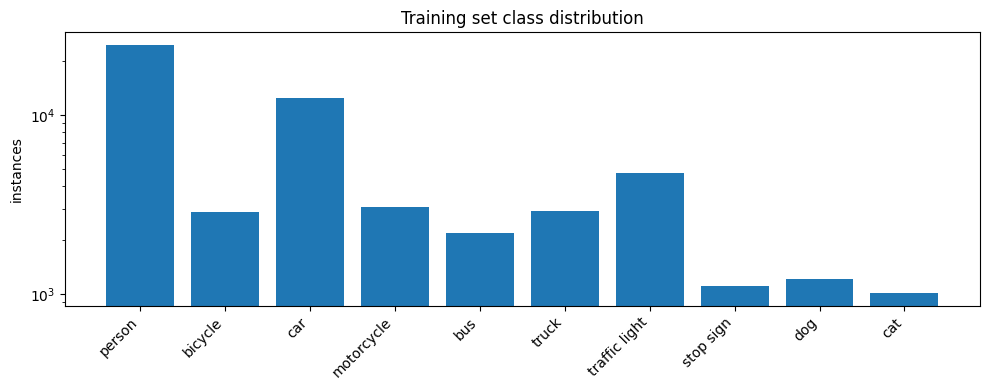

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np


def count_split(split):
    c = Counter()
    for p in glob.glob(f"{DATA_ROOT}/labels/{split}/*.txt"):
        with open(p) as f:
            for line in f:
                if line.strip():
                    c[int(line.split()[0])] += 1
    return c


counts = count_split("train")
val_counts = count_split("val")
test_counts = count_split("test")

print(f"{'class':<16}{'train':>10}{'val':>8}{'test':>8}")
for i, n in sorted(enumerate(CLASSES), key=lambda t: -counts.get(t[0], 0)):
    flag = "  <-- thin" if counts.get(i, 0) < 200 else ""
    print(f"{n:<16}{counts.get(i,0):>10,}{val_counts.get(i,0):>8,}{test_counts.get(i,0):>8,}{flag}")

vals = [counts.get(i, 0) for i in range(len(CLASSES))]
ratio = max(vals) / max(min(vals), 1)
print(f"\nmax/min instance ratio: {ratio:.0f}:1")

plt.figure(figsize=(10, 4))
plt.bar(CLASSES, [max(v, 0.5) for v in vals])
plt.xticks(rotation=45, ha="right")
plt.ylabel("instances")
plt.title("Training set class distribution")
plt.yscale("log")
plt.tight_layout()
plt.show()


## 7. Dataset YAML


In [ ]:
YAML_PATH = f"{DATA_ROOT}/dataset.yaml"

names_block = "\n".join(f"  {i}: {n}" for i, n in enumerate(CLASSES))
yaml_content = f"""path: {DATA_ROOT}
train: images/train
val: images/val
test: images/test

names:
{names_block}
"""

with open(YAML_PATH, "w") as f:
    f.write(yaml_content)

print(yaml_content)


path: /content/coco_subset
train: images/train
val: images/val
test: images/test

names:
  0: person
  1: bicycle
  2: car
  3: motorcycle
  4: bus
  5: truck
  6: traffic light
  7: stop sign
  8: dog
  9: cat



## 8. Verify the boxes visually

Do not skip this. A coordinate-convention mistake — top-left vs centre, or a width/height
swap — trains perfectly happily and produces a useless model. Boxes should sit tight on
the objects, not be offset down-right by half their size.


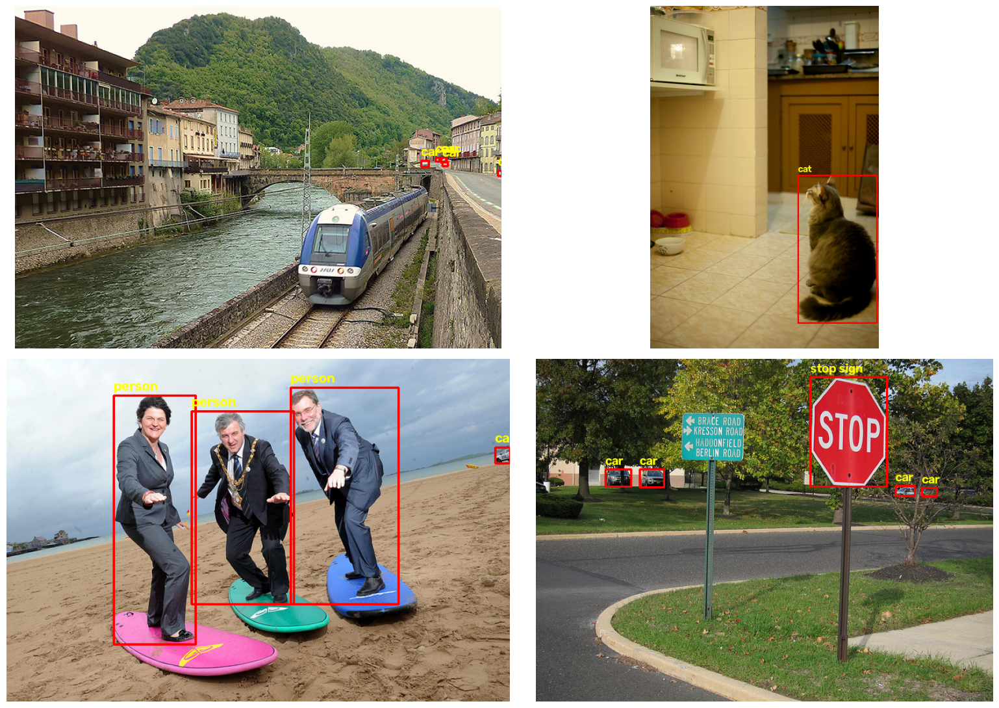

In [ ]:
import cv2

labelled = [p for p in sorted(glob.glob(f"{DATA_ROOT}/images/train/*.jpg"))
            if os.path.getsize(p.replace("/images/", "/labels/").replace(".jpg", ".txt")) > 0]
sample = random.Random(0).sample(labelled, 4)

fig, axes = plt.subplots(2, 2, figsize=(16, 11))

for ax, img_path in zip(axes.ravel(), sample):
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    H, W = img.shape[:2]

    lbl = img_path.replace("/images/", "/labels/").replace(".jpg", ".txt")
    with open(lbl) as f:
        for line in f:
            cls, xc, yc, bw, bh = line.split()
            cls = int(cls)
            xc, yc, bw, bh = float(xc) * W, float(yc) * H, float(bw) * W, float(bh) * H
            x1, y1 = int(xc - bw / 2), int(yc - bh / 2)
            x2, y2 = int(xc + bw / 2), int(yc + bh / 2)
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(img, CLASSES[cls], (x1, max(y1 - 6, 12)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 0), 2)

    ax.imshow(img)
    ax.axis("off")

plt.tight_layout()
plt.show()


## 9. Shortcut: the pretrained model

Run this if you want a COCO detector without training anything. All 80 classes, out of
the box, and it will beat anything you train on 8k images.


In [ ]:
# pretrained = YOLO("yolo11s.pt")
# r = pretrained.predict(sorted(glob.glob(f"{DATA_ROOT}/images/val/*.jpg"))[:1], conf=0.25)[0]
# plt.figure(figsize=(12, 8)); plt.imshow(cv2.cvtColor(r.plot(), cv2.COLOR_BGR2RGB)); plt.axis("off"); plt.show()


## 10. Train

**The `PRETRAINED` fix.** `YOLO("yolo11s.pt")` loads COCO weights into the model at
construction time. Passing `pretrained=False` to `train()` does not undo that — it only
controls whether Ultralytics goes looking for a checkpoint to load. To genuinely start
from random init you build the architecture from its YAML. The cell below does the right
thing for either setting.

Settings that matter:

- `cos_lr=True` — cosine decay converges more cleanly than linear on short runs.
- `mosaic=1.0` with `close_mosaic=10` — mosaic manufactures scale variation and crowded
  scenes, which is exactly what detection wants. Turning it off for the last 10 epochs
  lets the model settle on real image statistics.
- `patience=15` — stop once val mAP plateaus. Keep it above `close_mosaic`, or early
  stopping can fire before the mosaic-off phase ever runs and you lose that gain.
- `warmup_epochs=3` — matters more when `PRETRAINED=False`.
- `seed` + `deterministic=True` — two runs with the same config are now comparable, which
  you need before any of your hyperparameter comparisons mean anything.
- `cache="disk"` — images are decoded once and memory-mapped. Costs disk, saves a few
  seconds per epoch. Use `cache=True` (RAM) only if the dataset is under ~4 GB.
- OOM: halve `BATCH`, or set `batch=-1` to let Ultralytics auto-size to ~60% VRAM.


In [16]:
if PRETRAINED:
    model = YOLO(MODEL_WEIGHTS)                      # COCO weights, head reinitialised for N classes
else:
    model = YOLO(MODEL_WEIGHTS.replace(".pt", ".yaml"))   # architecture only, random init

results = model.train(
    data=YAML_PATH,
    epochs=EPOCHS,
    imgsz=IMGSZ,
    batch=BATCH,
    workers=2,
    device=0,
    seed=SEED,
    deterministic=True,
    amp=True,
    optimizer="auto",
    cos_lr=True,
    warmup_epochs=3.0,
    patience=15,
    cache="disk",
    # augmentation
    mosaic=1.0,
    close_mosaic=10,
    mixup=0.0,
    fliplr=0.5,
    scale=0.5,
    translate=0.1,
    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,
    # bookkeeping
    project=PROJECT_DIR,
    name=RUN_NAME,
    exist_ok=True,
    plots=True,
    save=True,
    save_period=10,
    val=True,
)


Ultralytics 8.4.156 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=disk, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/coco_subset/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11s_coco_subset, nbs=64, nms=None, opset=

### If Colab disconnected mid-run

Re-run every cell above through the YAML cell (images are cached on disk, so it is fast),
then run this instead of the training cell.


In [17]:
# model = YOLO(f"{PROJECT_DIR}/{RUN_NAME}/weights/last.pt")
# results = model.train(resume=True)


## 11. Evaluate

`mAP50-95` is the headline number — mean AP averaged over IoU thresholds 0.50 to 0.95.
`mAP50` is the looser version most people quote informally.

Report the **test** split. Val was used for early stopping and for picking `best.pt`, so
val mAP is a selection-biased estimate — usually 1-3 points optimistic on a subset this
size. Both are printed so you can see the gap.

Per-class AP is indexed through `metrics.box.ap_class_index`, because `maps` covers every
class in the YAML while the AP arrays only cover classes that actually appeared in the
split. Positional zipping silently misaligns the two whenever a class has zero val
instances.


In [18]:
BEST = f"{PROJECT_DIR}/{RUN_NAME}/weights/best.pt"
model = YOLO(BEST)


def report(split, train_counts):
    m = model.val(data=YAML_PATH, split=split, imgsz=IMGSZ, batch=BATCH, device=0, plots=(split == "test"))
    print(f"\n=== {split} ===")
    print(f"mAP50-95: {m.box.map:.4f}")
    print(f"mAP50:    {m.box.map50:.4f}")
    print(f"mAP75:    {m.box.map75:.4f}")
    print(f"Precision:{m.box.mp:.4f}   Recall: {m.box.mr:.4f}")

    print("\nPer-class:")
    seen = set()
    for i, c in enumerate(m.box.ap_class_index):
        c = int(c)
        seen.add(c)
        print(f"  {CLASSES[c]:<15} AP50-95 {m.box.maps[c]:.4f}  AP50 {m.box.ap50[i]:.4f}"
              f"   ({train_counts.get(c, 0):,} train instances)")
    for c in range(len(CLASSES)):
        if c not in seen:
            print(f"  {CLASSES[c]:<15} no instances in {split} split — AP undefined")
    return m


val_metrics = report("val", counts)
test_metrics = report("test", counts)

print(f"\nSelection bias (val - test mAP50-95): {val_metrics.box.map - test_metrics.box.map:+.4f}")


Ultralytics 8.4.156 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11s summary (fused): 100 layers, 9,416,670 parameters, 0 gradients, 21.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 63.7±26.4 MB/s, size: 163.4 KB)
val: Scanning /content/coco_subset/labels/val.cache... 975 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 975/975 292.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 61/61 5.8it/s 10.5s
                   all        975       5604      0.724      0.621      0.688      0.486
                person        614       2728      0.774      0.631      0.731      0.469
               bicycle        105        210      0.731      0.476      0.548      0.311
                   car        352       1276      0.714      0.563      0.633      0.406
            motorcycle        102        220      0.765      0.592      0.695      0.422
                   bus        118        1

results.png


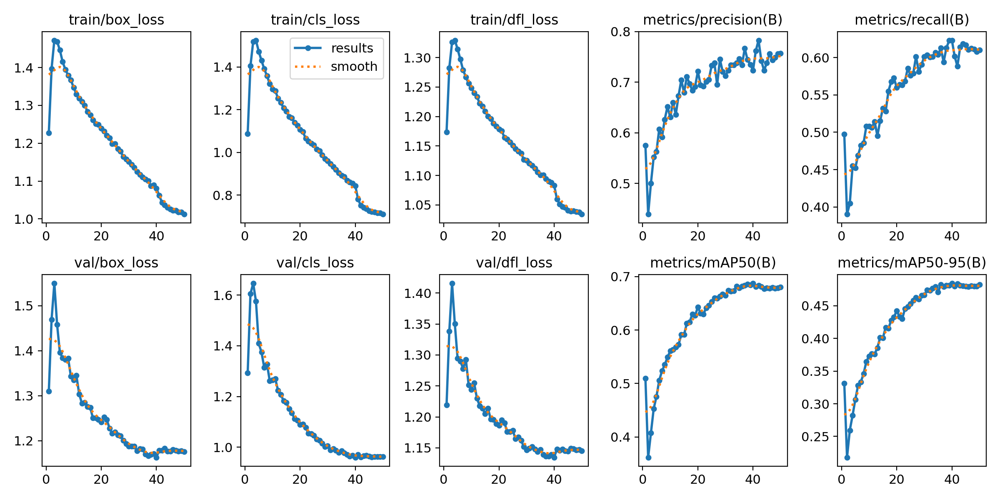

confusion_matrix_normalized.png


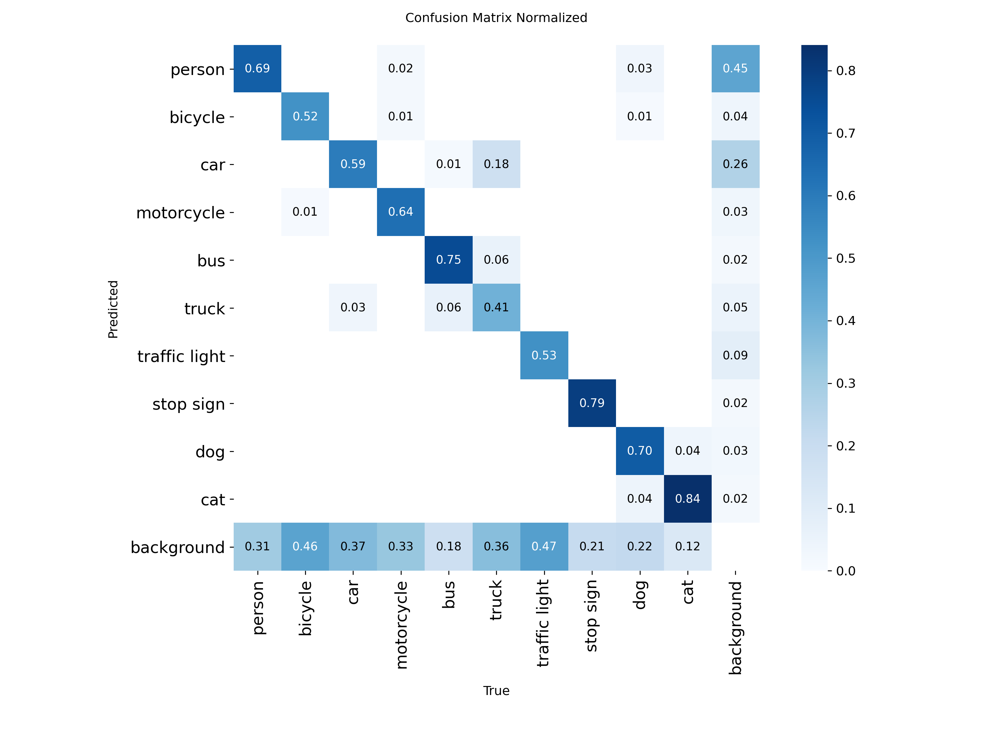

BoxPR_curve.png


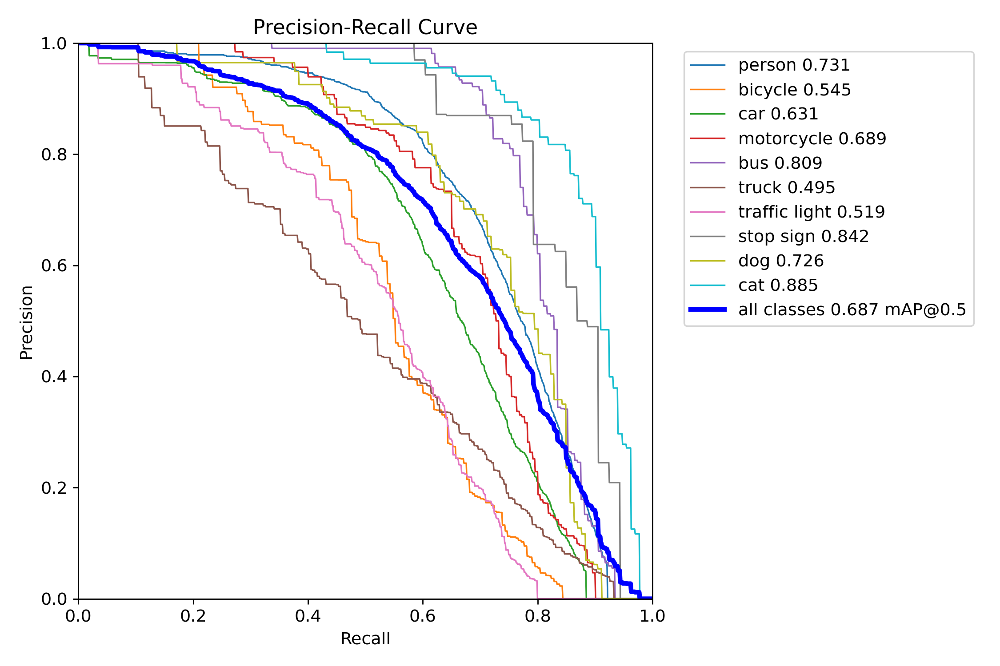

labels.jpg


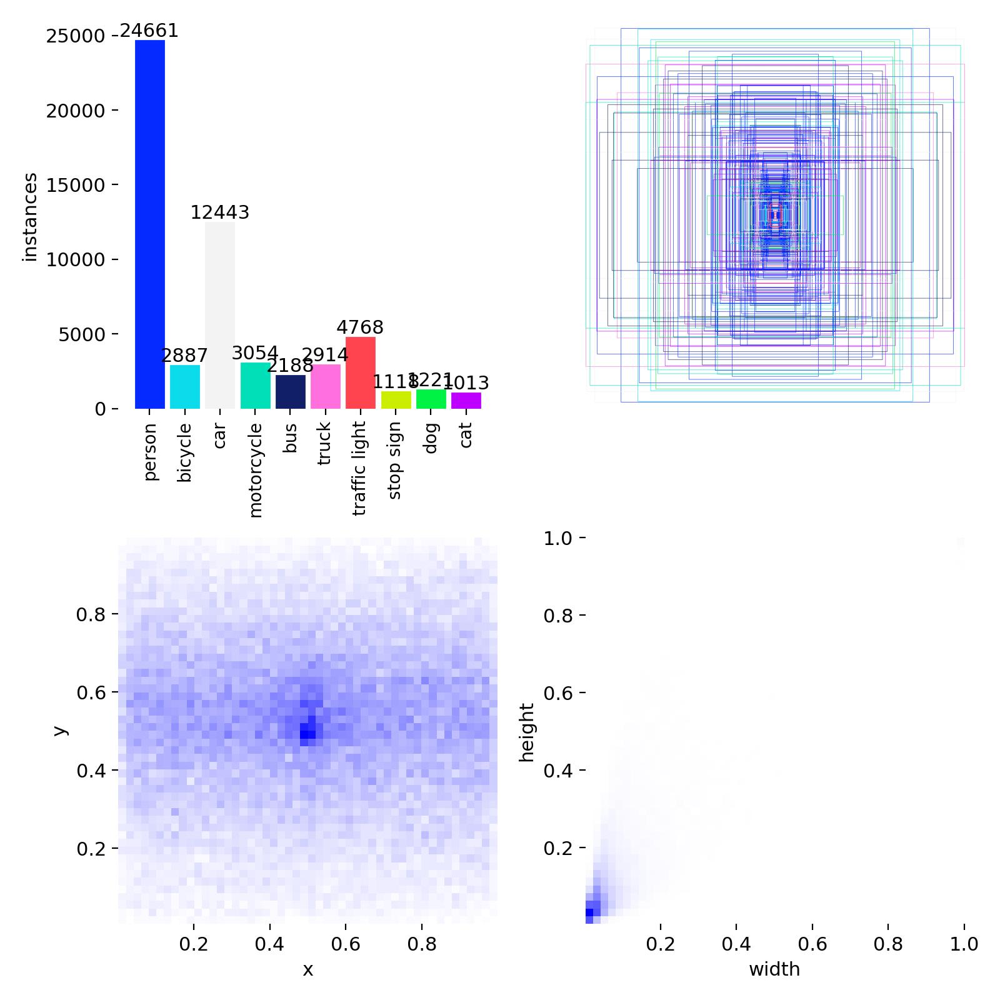

val_batch0_pred.jpg


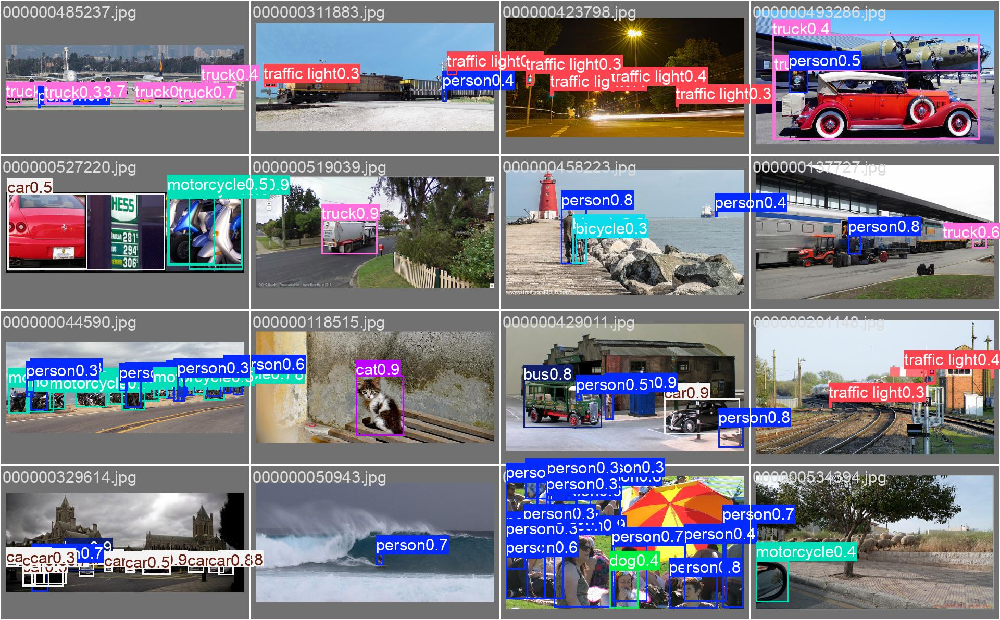

In [19]:
from IPython.display import Image as IPyImage, display

for name in ["results.png", "confusion_matrix_normalized.png", "BoxPR_curve.png",
             "labels.jpg", "val_batch0_pred.jpg"]:
    path = f"{PROJECT_DIR}/{RUN_NAME}/{name}"
    if os.path.exists(path):
        print(name)
        display(IPyImage(filename=path, width=900))


### Reading the results

- **Train loss falling, val mAP flat or falling** -> overfitting. 8k images is small;
  raise `MAX_TRAIN_IMAGES` before you reach for stronger augmentation.
- **One class near zero AP** -> check its instance count in section 6 first. Under ~200
  and no amount of training helps.
- **Confusion between neighbouring classes** (car/truck/bus is the classic) -> that is
  COCO's own annotation ambiguity, not your bug. Merging them into one `vehicle` class is
  a legitimate fix if your application allows it.
- **High precision, low recall** -> lower `conf` at inference; the model is fine, the
  threshold is conservative.


## 12. Predict

`conf=0.25` is the usual default. Lower to catch more objects at the cost of false
positives; raise for cleaner but sparser output. `iou=0.7` is the NMS threshold — lower
it if overlapping duplicates survive.



0: 640x640 4 persons, 3 buss, 11.0ms
1: 640x640 1 cat, 11.0ms
2: 640x640 5 persons, 3 cars, 1 bus, 11.0ms
3: 640x640 2 persons, 1 car, 1 bus, 2 trucks, 11.0ms
4: 640x640 2 persons, 4 cars, 1 bus, 1 truck, 11.0ms
5: 640x640 8 persons, 11.0ms
Speed: 3.7ms preprocess, 11.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


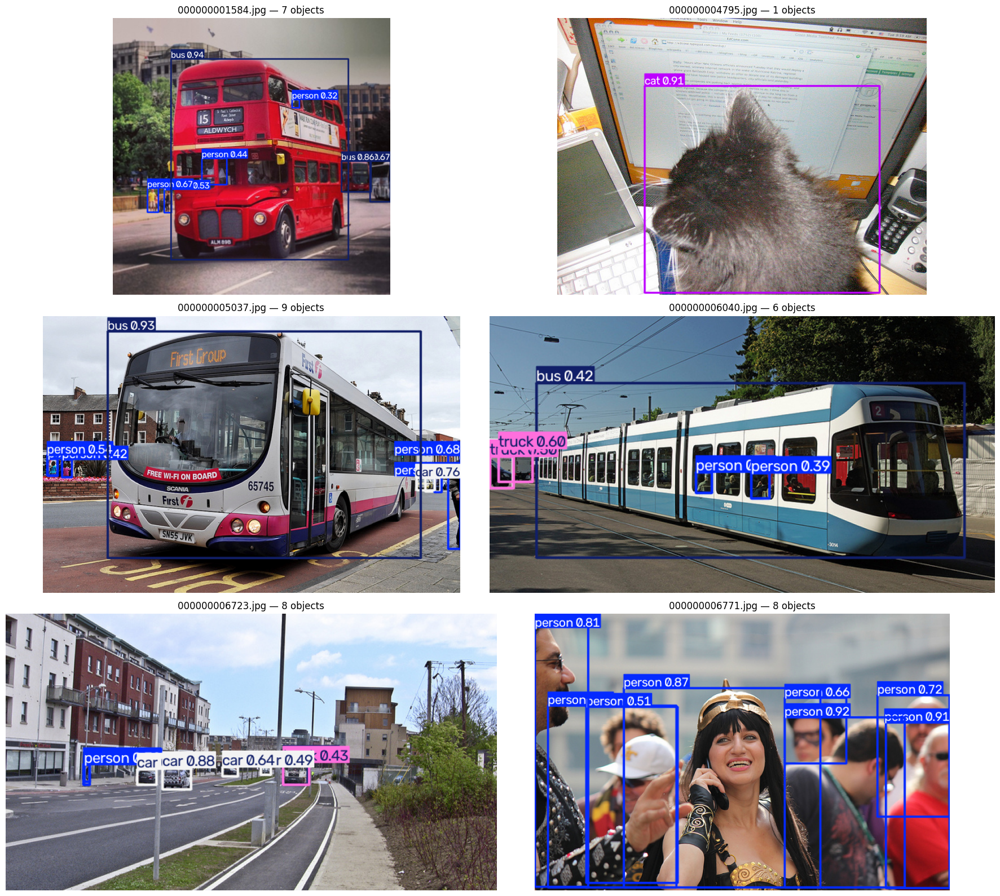

In [20]:
test_images = sorted(glob.glob(f"{DATA_ROOT}/images/test/*.jpg"))[:6]

preds = model.predict(test_images, imgsz=IMGSZ, conf=0.25, iou=0.7, device=0)

fig, axes = plt.subplots(3, 2, figsize=(18, 16))
for ax, p in zip(axes.ravel(), preds):
    ax.imshow(cv2.cvtColor(p.plot(), cv2.COLOR_BGR2RGB))
    ax.set_title(f"{os.path.basename(p.path)} — {len(p.boxes)} objects")
    ax.axis("off")
plt.tight_layout()
plt.show()


In [21]:
# Structured output rather than a rendered image
for p in preds[:2]:
    print(os.path.basename(p.path))
    for b in p.boxes:
        cls = CLASSES[int(b.cls)]
        conf = float(b.conf)
        x1, y1, x2, y2 = [round(v) for v in b.xyxy[0].tolist()]
        print(f"  {cls:<15} {conf:.2f}  [{x1}, {y1}, {x2}, {y2}]")
    print()


000000001584.jpg
  bus             0.94  [128, 90, 520, 535]
  bus             0.86  [504, 316, 570, 384]
  person          0.67  [76, 376, 101, 429]
  bus             0.67  [568, 316, 612, 406]
  person          0.53  [114, 379, 129, 431]
  person          0.44  [196, 310, 252, 368]
  person          0.32  [395, 180, 412, 198]

000000004795.jpg
  cat             0.91  [152, 118, 558, 476]



## 13. Export

`best.pt` is already under `{PROJECT_DIR}/{RUN_NAME}/weights/`. Export only if you need
inference outside PyTorch — ONNX for most runtimes, TensorRT for NVIDIA edge devices,
TFLite for mobile. Always re-run `val()` on the exported file: INT8 quantisation can cost
several mAP points and you want to know how many.


In [22]:
# path = model.export(format="onnx", imgsz=IMGSZ, simplify=True, opset=12)
# YOLO(path).val(data=YAML_PATH, split="test", imgsz=IMGSZ, device=0)

# model.export(format="tflite", imgsz=IMGSZ, int8=True, data=YAML_PATH)


## Appendix A: what to change if results are poor

In the order worth trying:

1. **More images.** Detection is data-bound long before it is architecture-bound. 8k ->
   25k is worth far more than yolo11s -> yolo11m.
2. **Fewer classes.** Ten classes sharing one image budget starves the tail. Five
   well-populated classes beat ten thin ones every time.
3. **Longer, with patience.** 50 epochs on a small subset is usually not the binding
   constraint, but check `results.png` — if val mAP was still climbing at the end, raise
   `EPOCHS`.
4. **Bigger `imgsz`.** 640 -> 960 helps small objects (traffic lights especially) and
   costs roughly 2.2x the time. Halve `BATCH` when you do.
5. **Bigger model.** yolo11s -> yolo11m last, once the data is right.

Things that rarely help on a subset this size: heavy mixup, custom anchor tuning (YOLO11
is anchor-free, there are none), and a hand-tuned LR when `optimizer="auto"` already sets
a reasonable one.

## Appendix B: training on the full COCO

Ultralytics ships a `coco.yaml` that auto-downloads all 118k train images (~19 GB):

```python
model = YOLO("yolo11s.pt")
model.train(data="coco.yaml", epochs=100, imgsz=640, batch=16, device=0)
```

Be realistic about cost. One epoch over 118k images at 640px is roughly an hour on a T4,
so 100 epochs is about four days of uninterrupted compute — well past any Colab session
limit. Published YOLO11 COCO results come from multi-GPU runs of 300-500 epochs. Full-COCO
training from scratch is an A100-cluster job, not a notebook one.
